In [1]:
import numpy as np
import pandas as pd
import os

In [2]:
import matplotlib.pyplot as plt
from PIL import Image
import torch
import torch.nn as nn
import torch.functional as F
import torch.optim as optim
import torchvision
import torchvision.transforms as T
import torchvision.datasets as datasets
from torch.utils.data import Dataset
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import torchvision.models as models
import os
from tqdm import tqdm

In [3]:
if torch.cuda.is_available():
    device = torch.device("cuda")
    print("CUDA is available. Using GPU.")
else:
    device = torch.device("cpu")
    print("CUDA is not available. Using CPU.")

CUDA is available. Using GPU.


In [4]:
class ConvBlock(nn.Module):
  # helper module that consists of a Conv -> BN -> ReLU
  def __init__(self, in_channels, out_channels, padding=1, kernel_size=3, stride=1, with_nonlinearity=True):
    super().__init__()
    self.conv = nn.Conv2d(in_channels, out_channels, padding=padding, kernel_size=kernel_size, stride=stride)
    self.bn = nn.BatchNorm2d(out_channels)
    self.relu = nn.ReLU()
    # with_nonlinearity is a boolean flag indicating whether to include the ReLU activation.
    self.with_nonlinearity = with_nonlinearity

  def forward(self, x):
    x = self.conv(x)
    x = self.bn(x)
    if self.with_nonlinearity:
        x = self.relu(x)
    return x

In [5]:
# bridge between the downsampling part with the upsampling part
class Bridge(nn.Module):
    """
    A module serving as a bridge between the downsampling and upsampling parts of a network.
    It consists of two consecutive ConvBlocks.

    Args:
        in_channels (int): Number of input channels.
        out_channels (int): Number of output channels.
    """
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.bridge = nn.Sequential(
          ConvBlock(in_channels, out_channels),
          ConvBlock(out_channels, out_channels)
        )

    def forward(self, x):
        return self.bridge(x)

In [6]:
resnet = torchvision.models.resnet.resnet50(pretrained=True)
vgg = torchvision.models.vgg16(pretrained=True)

/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 144MB/s] 
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed 

In [7]:
list(vgg.features.children())

[Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1)),
 ReLU(inplace=True),
 Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1)),
 ReLU(inplace=True),
 MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False),
 Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1)),
 ReLU(inplace=True),
 Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1)),
 ReLU(inplace=True),
 MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False),
 Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1)),
 ReLU(inplace=True),
 Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1)),
 ReLU(inplace=True),
 Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1)),
 ReLU(inplace=True),
 MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False),
 Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1)),
 ReLU(inplace=True),
 Conv2d(512, 512, kernel_size=(3, 3), stride=(1

In [8]:
down_blocks = []
for layer in resnet.children():
    if isinstance(layer, nn.Sequential):
        down_blocks.extend(bottleneck for bottleneck in layer)

In [9]:
class Encoder(nn.Module):
    def __init__(self, in_channels, pretrained=True):
        super(Encoder, self).__init__()
        resnet = torchvision.models.resnet.resnet50(pretrained=True)
        down_blocks = []
        
        self.input_layer = nn.Conv2d(in_channels, 256, kernel_size=7, stride=2, padding=3, bias=False)
        
        for layer in resnet.children():
            if isinstance(layer, nn.Sequential):
                down_blocks.extend(bottleneck.to(device) for bottleneck in layer)
        
        self.down_blocks = down_blocks[1:]  # Getting rid of the first layer
        self.brid = Bridge(2048, 2048).to(device)

    def forward(self, x):
        intermediate_outputs = dict()
        
        x = self.input_layer(x)
        intermediate_outputs['input_layer'] = x.clone()
        
        for i, layer in enumerate(self.down_blocks):
            x = layer(x)
            intermediate_outputs[f"DownLayer{i}"] = x.clone()
        
        x = self.brid(x)
        intermediate_outputs['Post_Bridge'] = x.clone()
        return x, intermediate_outputs

In [10]:
in_channels = 8
height = 256
width = 192
rand = torch.rand(1, in_channels, height, width).to(device)

In [11]:
encoder = Encoder(in_channels).to(device)

In [12]:
output = encoder(rand)
output[0].shape, type(output[1])

(torch.Size([1, 2048, 16, 12]), dict)

In [13]:
for key, value in output[1].items():
    print(f"{key} -- {value.size()}")

input_layer -- torch.Size([1, 256, 128, 96])
DownLayer0 -- torch.Size([1, 256, 128, 96])
DownLayer1 -- torch.Size([1, 256, 128, 96])
DownLayer2 -- torch.Size([1, 512, 64, 48])
DownLayer3 -- torch.Size([1, 512, 64, 48])
DownLayer4 -- torch.Size([1, 512, 64, 48])
DownLayer5 -- torch.Size([1, 512, 64, 48])
DownLayer6 -- torch.Size([1, 1024, 32, 24])
DownLayer7 -- torch.Size([1, 1024, 32, 24])
DownLayer8 -- torch.Size([1, 1024, 32, 24])
DownLayer9 -- torch.Size([1, 1024, 32, 24])
DownLayer10 -- torch.Size([1, 1024, 32, 24])
DownLayer11 -- torch.Size([1, 1024, 32, 24])
DownLayer12 -- torch.Size([1, 2048, 16, 12])
DownLayer13 -- torch.Size([1, 2048, 16, 12])
DownLayer14 -- torch.Size([1, 2048, 16, 12])
Post_Bridge -- torch.Size([1, 2048, 16, 12])


In [14]:
class Decoder(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(Decoder, self).__init__()
        
        self.upsample9 = nn.Sequential(
            nn.ConvTranspose2d(in_channels, out_channels=1024, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(1024),
            nn.ReLU(inplace=True)
        )

        self.upsample5 = nn.Sequential(
            nn.ConvTranspose2d(1024 + 1024, 512, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True)
        )

        self.upsample1 = nn.Sequential(
            nn.ConvTranspose2d(512 + 512, 256, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True)
        )

        self.upsample_fin = nn.ConvTranspose2d(256 + 256, out_channels, kernel_size=3, stride=2, padding=1, output_padding=1)

    def forward(self, x, encoder_intermediates):
        x = self.upsample9(x)
        x = torch.cat((x, encoder_intermediates["DownLayer11"]), dim=1)

        x = self.upsample5(x)
        x = torch.cat((x, encoder_intermediates["DownLayer5"]), dim=1)

        x = self.upsample1(x)
        x = torch.cat((x, encoder_intermediates["DownLayer1"]), dim=1)

        x = nn.Sigmoid()(self.upsample_fin(x))
        return x

In [15]:
decoder = Decoder(2048, 8).to(device)
decoder_out = decoder(output[0], output[1])

In [16]:
decoder_out.size()

torch.Size([1, 8, 256, 192])

In [17]:
class UNet(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(UNet, self).__init__()
        self.encoder = Encoder(in_channels).to(device)
        self.decoder = Decoder(2048, out_channels).to(device) # 2048 channels output from the Encoder

    def forward(self, x):
        # forward pass through the encoder        
        x, encoder_outputs = self.encoder(x)

        # forward pass through the decoder with encoder's intermediate outputs
        decoder_output = self.decoder(x, encoder_outputs)
        
        return decoder_output

In [91]:
dummyunet = UNet(23,3).to(device)
rand = torch.rand(1, 23, 256, 192).to(device)
u_out = dummyunet(rand)
u_out.shape

torch.Size([1, 3, 256, 192])

In [19]:
class Discriminator(nn.Module):
    def __init__(self, input_channels):
        super(Discriminator, self).__init__()
        
        # additional layers to reduce input channels
        self.conv1 = nn.Conv2d(input_channels, 6, kernel_size=3, stride=1, padding=1)
        self.bn1 = nn.BatchNorm2d(6)
        self.relu1 = nn.ReLU(inplace=True)
        
        self.conv2= nn.Conv2d(6, 3, kernel_size=3, stride=1, padding=1)
        self.bn2 = nn.BatchNorm2d(3)
        self.relu2= nn.ReLU(inplace=True)
        # pre-trained ResNet50
        self.resnet50 = models.resnet50(pretrained=True)
        
        # freeze all layers
        for param in self.resnet50.parameters():
            param.requires_grad = False
            
        # unfreeze layer4 of ResNet50
        for param in self.resnet50.layer4.parameters():
            param.requires_grad = True
        
        # modify the final layer for binary classification
        num_ftrs = self.resnet50.fc.in_features
        self.resnet50.fc = nn.Linear(num_ftrs, 1)
        
        for param in self.resnet50.fc.parameters():
            param.requires_grad = True
        
        # sigmoid activation for binary classification
        self.sigmoid = nn.Sigmoid()


    def forward(self, x):
        # additional layers
        x = self.conv1(x)
        x=self.bn1(x)
        x = self.relu1(x)
        
        
        x=self.conv2(x)
        x=self.bn2(x)
        x=self.relu2(x)
        
        # forward pass through ResNet50
        x = self.resnet50(x)
                          
        # apply sigmoid activation
        x = self.sigmoid(x)
        
        return x

## Mask Inpainting
We need to fully maintain the untargeted body parts as well as adaptively preserve the changeable body part (i.e. arms)

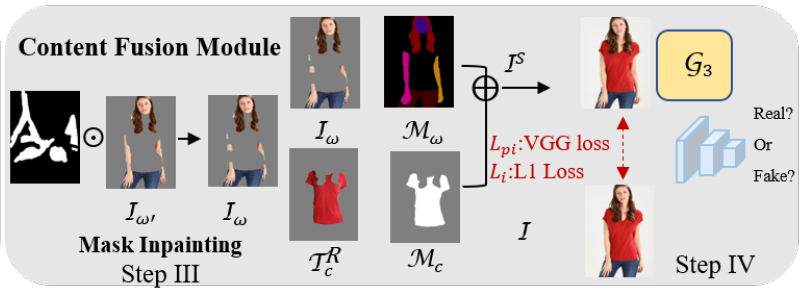


In [20]:
def one_hot_encode(labels, class_values):
    """
    Perform one-hot encoding on segmentation labels.

    Args:
        labels (torch.Tensor): Tensor containing label values.
        class_values (list): List of unique class values.

    Returns:
        torch.Tensor: One-hot encoded tensor with channels corresponding to each class.
    """
    one_hot_labels = torch.zeros(len(class_values), *labels.shape[1:])

    for i, class_value in enumerate(class_values):
        one_hot_labels[i] = (labels == class_value).float()

    return one_hot_labels

In [21]:
label_values = [0.0, 1.0, 2.0, 3.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0, 12.0, 13.0]

In [22]:
def crop_image(img_np, height, width):
    """
    Crops an image to a specified height and width without maintaining the aspect ratio.

    Args:
      img_np: A NumPy array representing the image.
      height: The desired height of the cropped image.
      width: The desired width of the cropped image.

    Returns:
      A NumPy array representing the cropped image.

    Raises:
      ValueError: If the desired height or width is larger than the original image dimensions.
    """

    height_orig, width_orig = img_np.shape[:2]

    if height > height_orig or width > width_orig:
      raise ValueError("Desired height or width cannot be larger than the original image dimensions.")

    start_x = (width_orig - width) // 2
    end_x = start_x + width
    start_y = (height_orig - height) // 2
    end_y = start_y + height

    return img_np[start_y:end_y, start_x:end_x]

In [23]:
def openimage(path,mode=0):
    if mode==1:
        return np.expand_dims(np.array(Image.open(path).convert("L")),axis=-1)  
        # opens in grayscale, we need to open each posemap in b/w
    else:
        return(np.array(Image.open(path)))

In [39]:
Mw_dir= "/kaggle/input/acgpn-dataset/ACGPN_traindata/train_label/"
img_dir= "/kaggle/input/acgpn-dataset/ACGPN_traindata/train_img/"
Mws= sorted(os.listdir(Mw_dir))
imgs= sorted(os.listdir(img_dir))

In [52]:
Mw=openimage(Mw_dir+Mws[0],1).transpose(2,0,1))

img=openimage(img_dir+imgs[0])
neck= np.reshape(Mw[0],(256,192,1))*img/255

Mw.shape, img.shape

((256, 192, 1), (256, 192, 3))

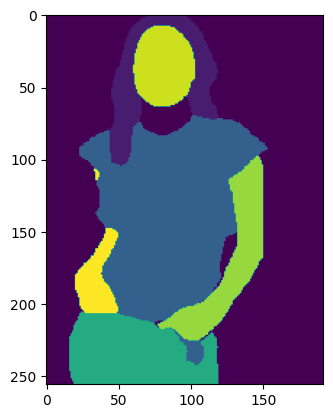

In [54]:
plt.imshow(Mw)

In [46]:
Mw

array([[[1., 1., 1., ..., 1., 1., 1.],
        [1., 1., 1., ..., 1., 1., 1.],
        [1., 1., 1., ..., 1., 1., 1.],
        ...,
        [1., 1., 1., ..., 1., 1., 1.],
        [1., 1., 1., ..., 1., 1., 1.],
        [1., 1., 1., ..., 1., 1., 1.]],

       [[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]],

       [[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]],

       ...,

       [[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0.

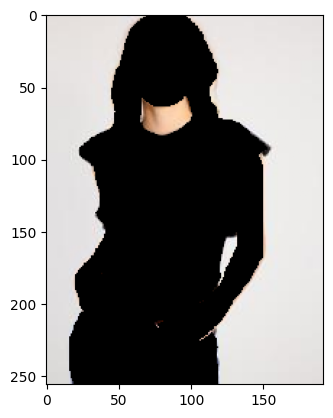

In [45]:
plt.imshow(neck)

In [65]:
class CFMDataset(Dataset):
    def __init__(self, mode, transforms=None):
        super().__init__()
        if mode[:2].lower()=="te":
            base_dir="/kaggle/input/acgpn-dataset/ACGPN_testdata/test_"
        else:
            base_dir="/kaggle/input/acgpn-dataset/ACGPN_traindata/train_"
            
        # set directory paths
        
        self.img_dir = base_dir + "img/"
        self.M_w_dir = base_dir + "mask_Mw/"
        self.paint_dir = base_dir + "mask/"
        self.clothseg_dir = base_dir + "label/"
        self.transforms = transforms
        
        self.M_w = sorted(os.listdir(self.M_w_dir))
        self.images = sorted(os.listdir(self.img_dir))
        self.paints = sorted(os.listdir(self.paint_dir)) # around 12k paints
        self.clothsegs = sorted(os.listdir(self.clothseg_dir))
        
    def __len__(self):
        return len(self.images)
    
    def __getitem__(self,index):       
        M_w = openimage(os.path.join(self.M_w_dir, self.M_w[index]),1)
        M_w = one_hot_encode(torch.from_numpy(M_w.transpose(2,0,1)), label_values) 
        # Mw, loading and one hot encoding, returns tensor
        M_w = M_w.numpy().transpose(1,2,0) # max = 1, min = 0, 13 channels
        
        # we get the original image of person
        image = openimage(os.path.join(self.img_dir, self.images[index]),0) # 3 channels
        rand = np.random.randint(0,len(self.images))
        real_image = openimage(os.path.join(self.img_dir, self.images[rand]),0)
        # we get the background and upclothes segments from the _label
        segments = openimage(os.path.join(self.clothseg_dir, self.clothsegs[index]),1)
        
        background = np.where(segments == 0, 1.0, 0.0) # 1 channel, we want to keep the bg for the neck
        
        neck=(image*background)/255  # 3 channels
        
        background = np.where(segments == 0, 0.0, 1.0) # inverted, 1 channel
        upcloth = np.where(segments == 4, 0.0, 1.0) # inverted, 1 channel
        upcloth_1 = np.where(segments == 4, 1.0, 0.0) # 1 channel
        
        # we get the paints and crop them to 256, 192
        rand = np.random.randint(0,len(self.paints)-1)
        paint = openimage(os.path.join(self.paint_dir, self.paints[rand]),1)/255
        paint = crop_image(paint,256,192)
        # paint inversion
        paint = np.where(paint > 0.5, 0, 1) # inverted, 1 channel
        
        # - image: (256, 192, 3)
        # - background: (256, 192, 1)
        # - upcloth: (256, 192, 1)
        # - upcloth_1: (256, 192, 1)
        # - paint: (256, 192,1)
        
        # removing the targeted area completely and inpainting over the non-targeted area
        combined_mask = background * upcloth * paint
        I_w = (image * combined_mask)/255 # 3 channels
        
        T_cR = (image * upcloth_1)/255 # 3 channels
        
        # - I_w: (256, 192, 3)
        # - M_w: (256, 192, 13)
        # - T_cR: (256, 192, 3)
        # - upcloth_1: (256, 192, 1)
        
        combined_image = np.concatenate((I_w, neck, M_w, T_cR, upcloth_1), axis=2) # 23 channels input
        
        input_tensor = torch.from_numpy(combined_image.transpose(2, 0, 1)).float()
        label_tensor = torch.from_numpy(image.transpose(2, 0, 1)).float()/255 # 3 channels output
        real_tensor = torch.from_numpy(real_image.transpose(2, 0, 1)).float()/255 # 3 channels
        
        return input_tensor, real_tensor, label_tensor

In [56]:
# example M_w
M_w = openimage("/kaggle/input/acgpn-dataset/ACGPN_traindata/train_mask_Mw/000006_0.png",1)
M_w = one_hot_encode(torch.from_numpy(M_w.transpose(2,0,1)), label_values) 
# Mw, loading and one hot encoding, returns tensor
M_w = M_w.numpy().transpose(1,2,0) # max = 1, min = 0

In [57]:
M_w.shape

(256, 192, 13)

In [58]:
tf= T.Compose(
        [
            T.ToTensor(),
        ]
    )

In [59]:
MODE= "TRAIN" # use "TEST" for traning, once ACGPN dataset has all test directories ready
BATCH_SIZE= 8

In [60]:
dataset = CFMDataset(MODE,transforms=tf)

In [61]:
len(dataset)

14221

In [62]:
train_dataloader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True)

In [63]:
len(train_dataloader)

1778

In [64]:
imgs, reals, labels = next(iter(train_dataloader))
imgs.shape, reals.shape,labels.shape

(torch.Size([8, 23, 256, 192]),
 torch.Size([8, 3, 256, 192]),
 torch.Size([8, 3, 256, 192]))

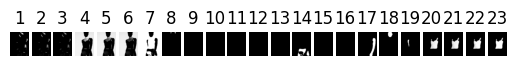

In [66]:
for channel in range(imgs.size(1)):
    plt.subplot(1, 23, channel + 1)
    plt.imshow(imgs[1, channel].cpu(), cmap='gray')
    plt.title(f'{channel + 1}')
    plt.axis('off')
plt.show()

In [67]:
min(np.transpose(np.squeeze(labels[0,:,:,:]),(1,2,0)).shape)

3

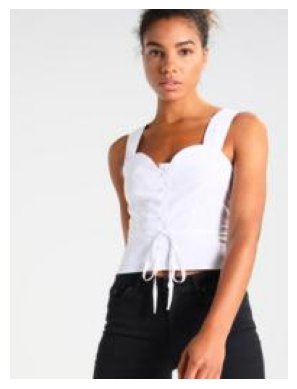

In [68]:
plt.imshow(np.transpose(np.squeeze(labels[1,:,:,:]),(1,2,0)))
plt.axis('off')  # Turn off axes for cleaner display
plt.show()

## VGG Loss

In [69]:
class VGGPerceptualLoss(nn.Module):
    """
    Calculate the perceptual loss between two images using VGG feature maps.

    This class takes two images/feature maps, computes their respective VGG feature maps at specified layers,
    and calculates the Mean Squared Error (MSE) loss between these feature maps.

    Args:
        feature_extractor (function): A feature extractor used to extract feature maps from input images.
        diction (dict): A dictionary specifying the layers from which feature maps are extracted.
                       Keys are layer numbers and values are corresponding layer sequences in the
                       feature extractor network.
        criterion (torch.nn.modules.loss) : The loss function for inter-layer loss.
        lambdas (dict) : The dictionary that stores the weights for weighted addition of losses.

    Methods:
        forward(x, y):
            Computes the perceptual loss between two images.

    """
    def __init__(self, feature_extractor, diction, criterion, lambdas):
        super(VGGPerceptualLoss, self).__init__()
        self.feature_extractor = feature_extractor
        self.diction = diction
        self.criterion = criterion
        self.lambdas = lambdas

    def forward(self, x, y):
        x_features = self.feature_extractor(x,self.diction)
        y_features = self.feature_extractor(y,self.diction)
#         print(len(x_features), len(y_features))
        loss = 0
        for layer_name,_ in self.diction.items():
            x_feat = x_features[layer_name]
            y_feat = y_features[layer_name]
            
            loss += self.lambdas[layer_name] * self.criterion(x_feat, y_feat)        
        return loss

In [70]:
features = list(vgg.features.children())[:28]
features = nn.Sequential(*features)
layers = {'6':'6','15':'15','27':'27'}
vgg_feature_extractor = {'6': features[:7], '15': features[7:16], '27': features[16:]}
lambdas = {'6': 0.3, '15': 0.3, '27': 0.4}
features

Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (17): Conv2d(256, 512, kernel_si

In [71]:
def feature_extractor(x, dic):
    """
    Takes a torch tensor x as input and passes them through the corresponding layers
    in the dictionary.
    
    Args:
        x (torch.Tensor) : The input tensor.
        dic (dict) : The layers of the VGG Network saved as values to corresponding layer
                    names as keys.
    
    Returns:
        features (dict) : Keys = Layer names (str), Values = Extracted tensors (torch.Tensor)
    """
    features = {}
    for name, sequence in dic.items():
        x= sequence(x)
        features[name] = x
    
    return features   
    

In [72]:

criterion_mse = nn.MSELoss()
vgg_tester= VGGPerceptualLoss(feature_extractor, vgg_feature_extractor, criterion_mse,lambdas)

In [75]:
rand1 = torch.rand(8, 3, 256, 192)
rand2= torch.rand(8,3,256,192)

In [76]:
vgg_loss= vgg_tester.forward(rand1,rand2)

In [77]:
type(vgg_loss)

torch.Tensor

In [78]:
vgg_loss

tensor(1.0529, grad_fn=<AddBackward0>)

In [79]:
len(imgs)

8

checking on actual images

In [80]:
vgg_tester.forward(reals[0],reals[0])

tensor(0., grad_fn=<AddBackward0>)

In [81]:
print("hello")

hello


In [82]:
imgs = imgs.to(device)
reals = reals.to(device)
labels = labels.to(device)

In [83]:
len(imgs)

8

In [84]:
imgs.shape,reals.shape, labels.shape

(torch.Size([8, 23, 256, 192]),
 torch.Size([8, 3, 256, 192]),
 torch.Size([8, 3, 256, 192]))

In [85]:
imgs.device,reals.device, labels.device

(device(type='cuda', index=0),
 device(type='cuda', index=0),
 device(type='cuda', index=0))

In [86]:
discriminator = Discriminator(3).to(device)
rand = torch.rand(1, 3, height, width).to(device)
disout = discriminator(rand)
disout.shape

/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


torch.Size([1, 1])

In [87]:
generator = UNet(23, 3).to(device) #23 in_channels and 1 out_channels

In [88]:
# generator = nn.DataParallel(generator)
# discriminator = nn.DataParallel(discriminator)

In [89]:
generator

UNet(
  (encoder): Encoder(
    (input_layer): Conv2d(23, 256, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (brid): Bridge(
      (bridge): Sequential(
        (0): ConvBlock(
          (conv): Conv2d(2048, 2048, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (bn): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (relu): ReLU()
        )
        (1): ConvBlock(
          (conv): Conv2d(2048, 2048, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (bn): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (relu): ReLU()
        )
      )
    )
  )
  (decoder): Decoder(
    (upsample9): Sequential(
      (0): ConvTranspose2d(2048, 1024, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), output_padding=(1, 1))
      (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (upsample5): Sequenti

In [92]:
discriminator

Discriminator(
  (conv1): Conv2d(3, 6, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn1): BatchNorm2d(6, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu1): ReLU(inplace=True)
  (conv2): Conv2d(6, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn2): BatchNorm2d(3, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu2): ReLU(inplace=True)
  (resnet50): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), 

In [93]:
criterion_bce = nn.BCELoss()
criterion_pixelwise = nn.CrossEntropyLoss()
criterion_mse = nn.MSELoss()


In [94]:
type(criterion_mse)

torch.nn.modules.loss.MSELoss

In [96]:
# features = list(vgg.features.children())[:28]
# features = nn.Sequential(*features)
# layers = {'6':'6','15':'15','27':'27'}
# vgg_dic = {'6': features[:6], '15': features[:15], '27': features}
# lambdas = {'6': 0.2, '15': 0.3, '27': 0.5}

features = list(vgg.features.children())[:28]
features = nn.Sequential(*features)
layers = {'6':'6','15':'15','27':'27'}
vgg_feature_extractor = {'6': features[:7].to(device), '15': features[7:16].to(device), '27': features[16:].to(device)}
lambdas = {'6': 0.3, '15': 0.3, '27': 0.4}

In [97]:
# vgg_dic

In [98]:
criterion_vgg = VGGPerceptualLoss(feature_extractor, vgg_feature_extractor, criterion_mse,lambdas).to(device)

In [99]:
criterion_vgg.forward(reals[0], reals[1])

tensor(1.9496, device='cuda:0', grad_fn=<AddBackward0>)

In [100]:
# testing criterion_vgg
generated_image = torch.randn(1, 3, 256, 192)  # Example generated image
target_image = torch.randn(1, 3, 256, 192)     # Example target image
generated_image = generated_image.to(device)
target_image = target_image.to(device)
loss = criterion_vgg(generated_image, target_image)
loss

tensor(5.9198, device='cuda:0', grad_fn=<AddBackward0>)

In [105]:
lr = 0.00002
epochs = 3 #actually 6
lambda1 = 0.1
lambda2 = 1
lambda3 = 1

In [101]:
optimizer_g = torch.optim.Adam(generator.parameters(), lr=lr, betas = (0.9, 0.999))
optimizer_d = torch.optim.Adam(discriminator.parameters(), lr=lr, betas = (0.9, 0.999))

In [102]:
total_iterations = len(train_dataloader)

Epoch 0 | Batch 0 | GenLoss 3.422199249267578 | DiscLoss 0.03841651976108551


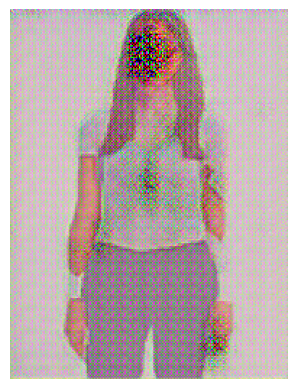

Epoch 0 | Batch 20 | GenLoss 3.59612774848938 | DiscLoss 0.018269050866365433


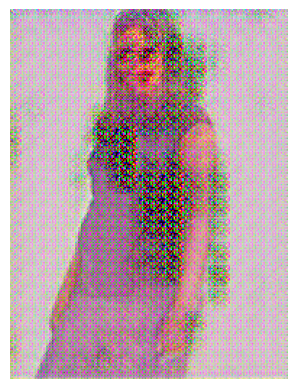

Epoch 0 | Batch 40 | GenLoss 3.559389591217041 | DiscLoss 0.014926835894584656


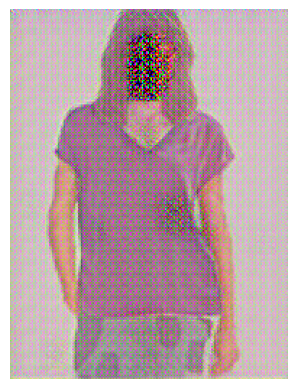

Epoch 0 | Batch 60 | GenLoss 3.538872480392456 | DiscLoss 0.01400377880781889


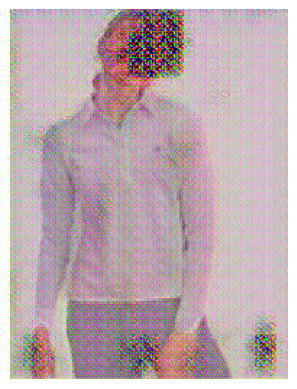

Epoch 0 | Batch 80 | GenLoss 3.7158546447753906 | DiscLoss 0.02911166474223137


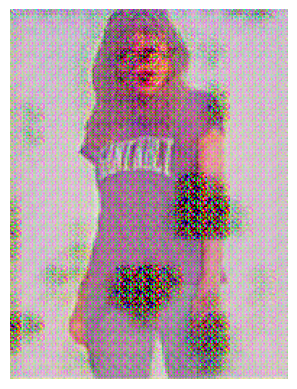

Epoch 0 | Batch 100 | GenLoss 3.534100294113159 | DiscLoss 0.18086448311805725


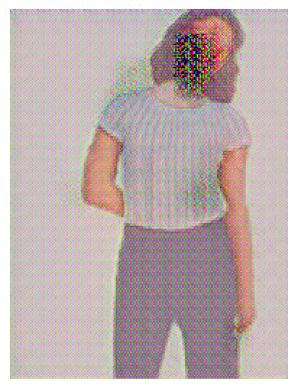

Epoch 0 | Batch 120 | GenLoss 3.70456862449646 | DiscLoss 0.015062185935676098


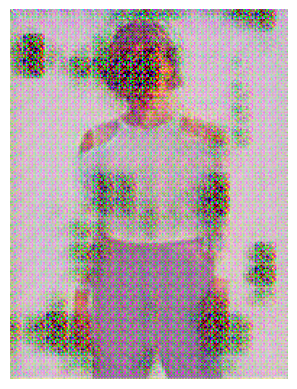

Epoch 0 | Batch 140 | GenLoss 3.289219617843628 | DiscLoss 0.039613496512174606


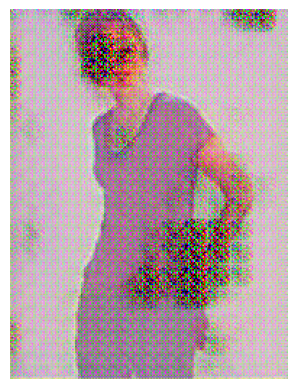

Epoch 0 | Batch 160 | GenLoss 3.449401378631592 | DiscLoss 0.01300101913511753


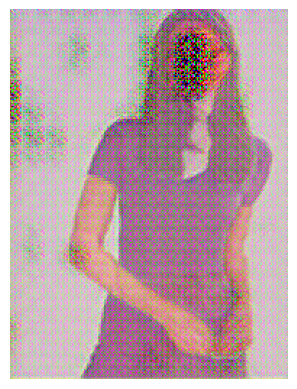

Epoch 0 | Batch 180 | GenLoss 3.656583070755005 | DiscLoss 0.008716369979083538


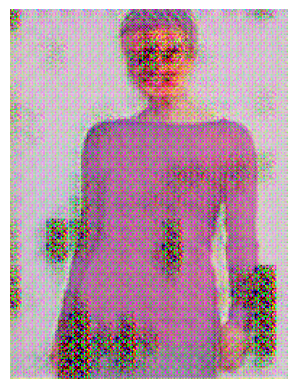

Epoch 0 | Batch 200 | GenLoss 3.60276198387146 | DiscLoss 0.0053217532113194466


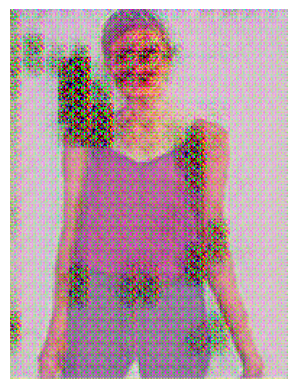

Epoch 0 | Batch 220 | GenLoss 3.7853164672851562 | DiscLoss 0.005435369908809662


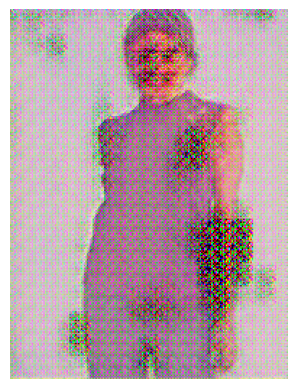

Epoch 0 | Batch 240 | GenLoss 3.620108127593994 | DiscLoss 0.05058123171329498


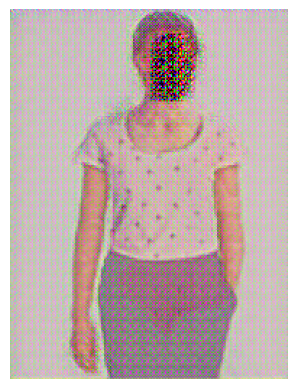

Epoch 0 | Batch 260 | GenLoss 3.7483174800872803 | DiscLoss 0.00467919185757637


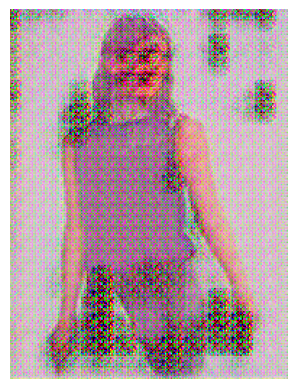

Epoch 0 | Batch 280 | GenLoss 3.681705951690674 | DiscLoss 0.004944786429405212


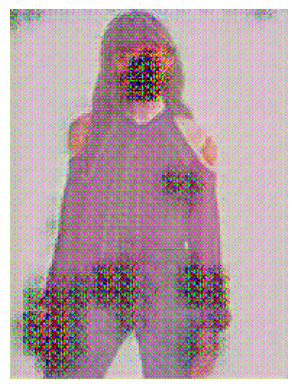

Epoch 0 | Batch 300 | GenLoss 3.914172410964966 | DiscLoss 0.859728217124939
Epoch 0 | Batch 480 | GenLoss 3.6326937675476074 | DiscLoss 0.015110479667782784


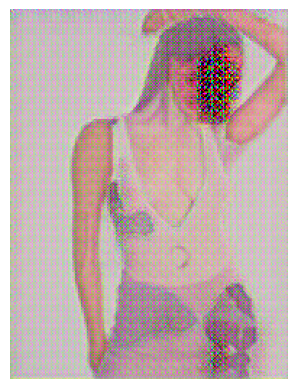

Epoch 0 | Batch 500 | GenLoss 3.732909917831421 | DiscLoss 0.1000475361943245


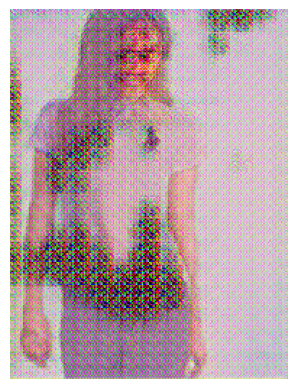

Epoch 0 | Batch 520 | GenLoss 3.3227007389068604 | DiscLoss 0.19894185662269592


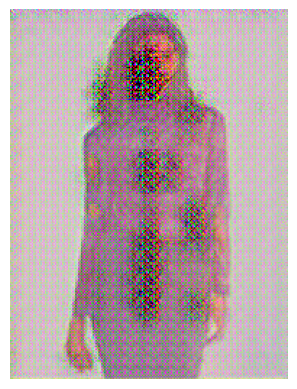

Epoch 0 | Batch 540 | GenLoss 3.5841002464294434 | DiscLoss 0.03956187516450882


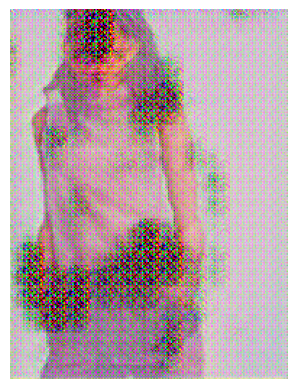

Epoch 0 | Batch 560 | GenLoss 3.455289125442505 | DiscLoss 0.05932572856545448


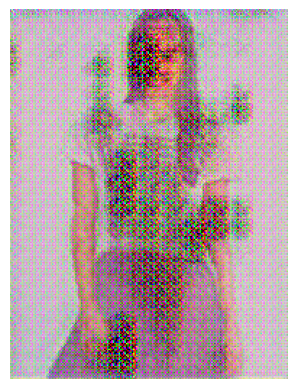

Epoch 0 | Batch 580 | GenLoss 3.8081226348876953 | DiscLoss 0.02345198579132557


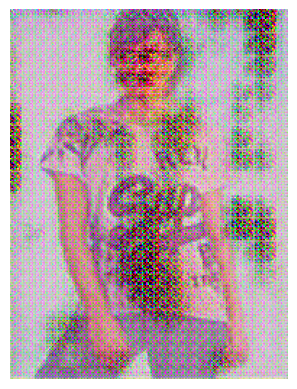

Epoch 0 | Batch 600 | GenLoss 3.6727242469787598 | DiscLoss 0.010957496240735054


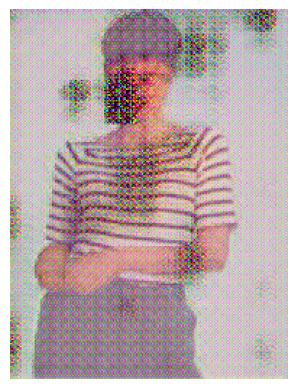

Epoch 0 | Batch 620 | GenLoss 3.6921169757843018 | DiscLoss 0.05695094168186188


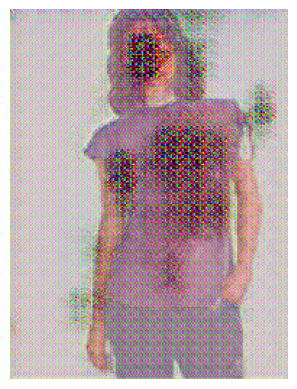

Epoch 0 | Batch 640 | GenLoss 3.4114747047424316 | DiscLoss 0.14429759979248047


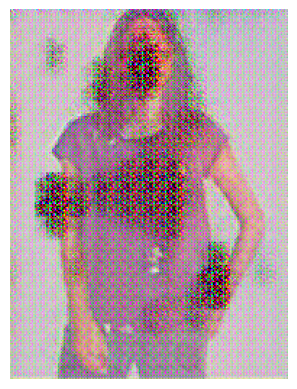

Epoch 0 | Batch 660 | GenLoss 3.917841911315918 | DiscLoss 0.011292045935988426


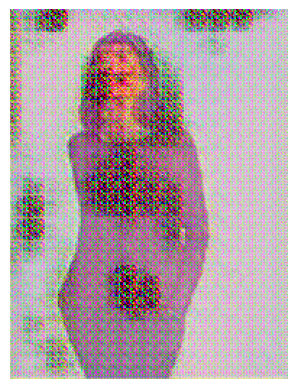

Epoch 0 | Batch 680 | GenLoss 3.904552936553955 | DiscLoss 0.00810557883232832


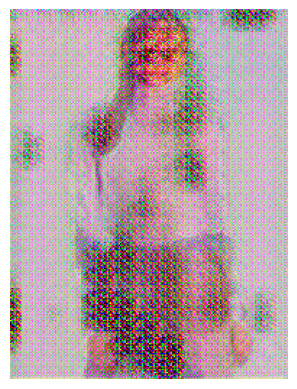

Epoch 0 | Batch 700 | GenLoss 3.6749157905578613 | DiscLoss 0.1024734303355217


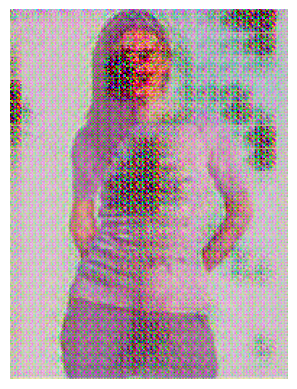

Epoch 0 | Batch 720 | GenLoss 3.5810093879699707 | DiscLoss 0.005036652088165283


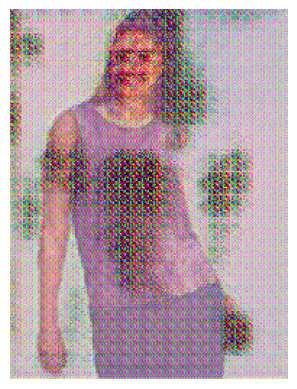

Epoch 0 | Batch 740 | GenLoss 3.4395461082458496 | DiscLoss 0.010443178936839104


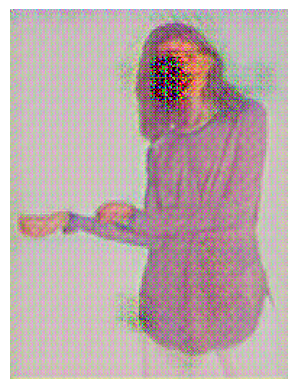

Epoch 0 | Batch 760 | GenLoss 3.310385227203369 | DiscLoss 4.410394668579102


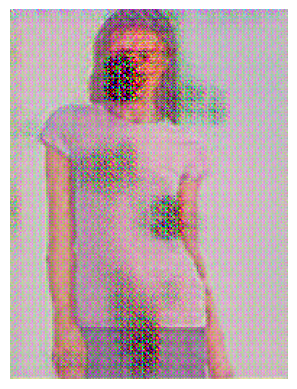

Epoch 0 | Batch 780 | GenLoss 3.8606173992156982 | DiscLoss 0.04119531437754631


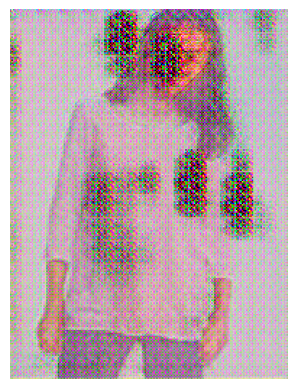

Epoch 0 | Batch 800 | GenLoss 3.266237735748291 | DiscLoss 0.07958345115184784


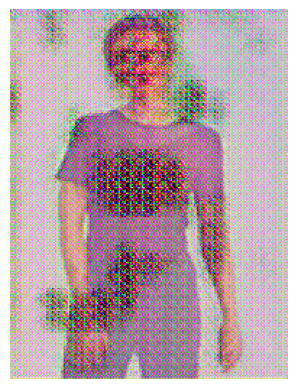

Epoch 0 | Batch 820 | GenLoss 3.8457131385803223 | DiscLoss 0.014417717233300209


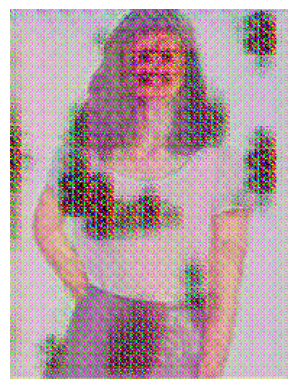

Epoch 0 | Batch 840 | GenLoss 3.8904128074645996 | DiscLoss 1.1233232021331787


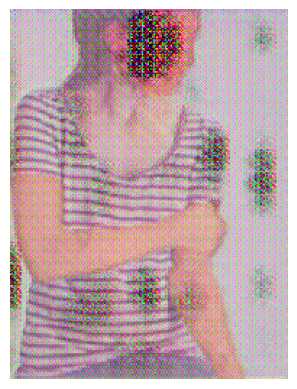

Epoch 0 | Batch 860 | GenLoss 3.6156721115112305 | DiscLoss 0.5144543647766113


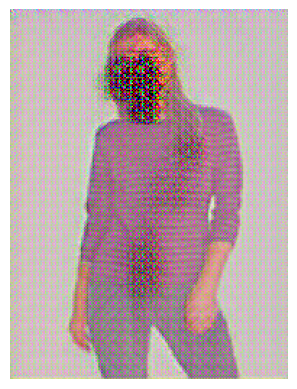

Epoch 0 | Batch 880 | GenLoss 3.420761823654175 | DiscLoss 0.042539745569229126


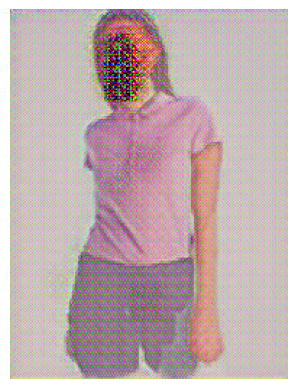

Epoch 0 | Batch 900 | GenLoss 3.415891408920288 | DiscLoss 0.038012340664863586


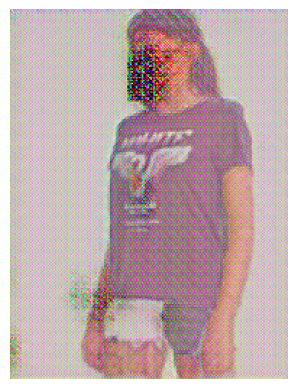

Epoch 0 | Batch 920 | GenLoss 3.5349888801574707 | DiscLoss 0.0264409389346838


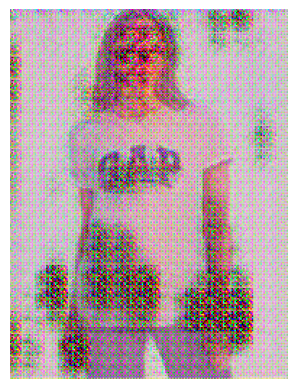

Epoch 0 | Batch 940 | GenLoss 3.473180055618286 | DiscLoss 0.012243088334798813


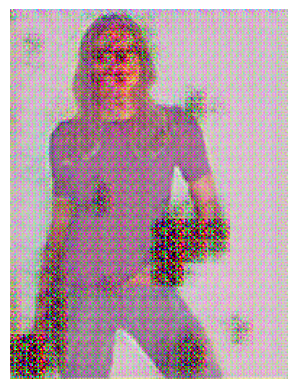

Epoch 0 | Batch 960 | GenLoss 3.7219443321228027 | DiscLoss 0.011760380119085312


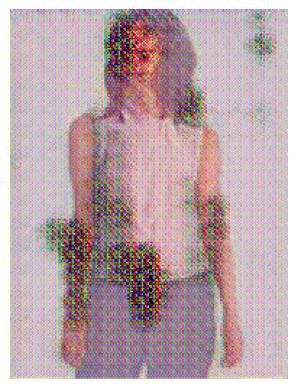

Epoch 0 | Batch 980 | GenLoss 3.7077407836914062 | DiscLoss 0.0166967511177063


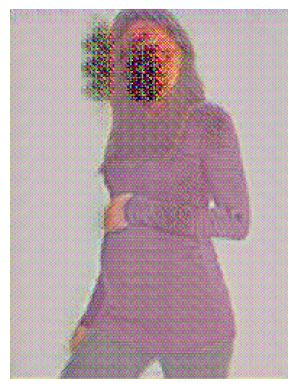

Epoch 0 | Batch 1000 | GenLoss 3.8519368171691895 | DiscLoss 0.018887152895331383


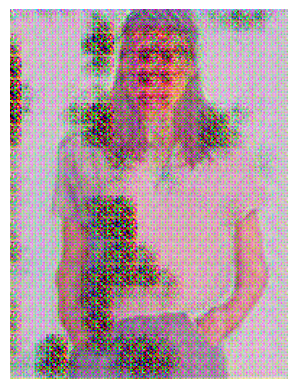

Epoch 0 | Batch 1020 | GenLoss 3.979126214981079 | DiscLoss 0.08834131807088852


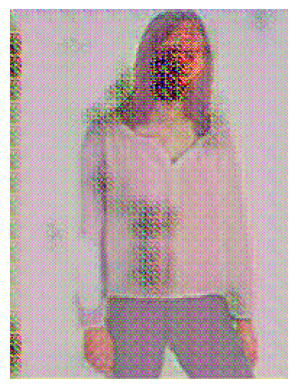

Epoch 0 | Batch 1040 | GenLoss 3.309734344482422 | DiscLoss 0.06957332044839859


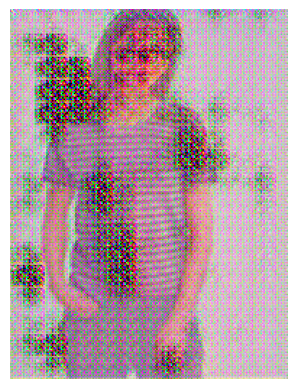

Epoch 0 | Batch 1060 | GenLoss 3.6895973682403564 | DiscLoss 0.008713115938007832


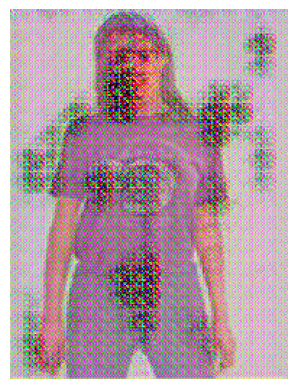

Epoch 0 | Batch 1080 | GenLoss 3.704030752182007 | DiscLoss 0.019800152629613876


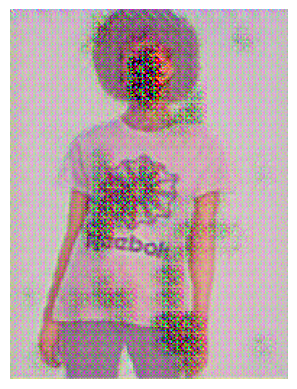

Epoch 0 | Batch 1100 | GenLoss 3.62278413772583 | DiscLoss 0.007314753718674183


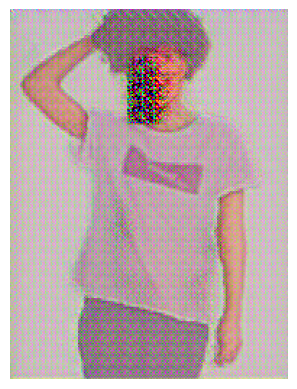

Epoch 0 | Batch 1120 | GenLoss 3.6501502990722656 | DiscLoss 0.007954088971018791


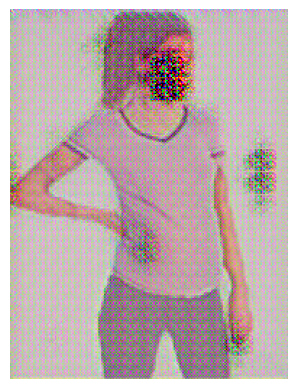

In [ ]:
for epoch in range(epochs):
    for i,data in enumerate(train_dataloader):
        if i>1770:
            break
        inputs, reals, finals = data
        # training discriminator
        # clear discriminator gradients
        optimizer_d.zero_grad()
        
        # send to device
        inputs = inputs.to(device)
        reals = reals.to(device)
        finals = finals.to(device)
        
        # pass real images through discriminator
        real_preds = discriminator(reals)
        real_targets = torch.ones(inputs.size(0), 1, device=device)
        
        real_loss = criterion_bce(real_preds, real_targets)  # calculate loss for real images

        # generate fake images
        fakes = generator(inputs)
        
        # pass fake images through discriminator
        fake_preds = discriminator(fakes)
        fake_targets = torch.zeros(fakes.size(0), 1, device=device)
        fake_loss = criterion_bce(fake_preds, fake_targets) # calculate loss for generated images
        
        # update discriminator weights
        disc_loss = real_loss + fake_loss
        disc_loss.backward()
        optimizer_d.step()      # update disc weights
        
        # Training generator
        # clear generator gradients
        optimizer_g.zero_grad()

        # generate fake images
        
        # latent = torch.randn(BATCH_SIZE, latent_size, 1, 1, device=device)
        fakes = generator(inputs)
        # try to fool the discriminator
        
        preds = discriminator(fakes)
        ce_loss = torch.nn.functional.cross_entropy(fakes, finals, reduction='mean')
        
        targets = torch.ones(BATCH_SIZE, 1, device=device)
        
#         print(fakes.shape,"\n",finals.shape)
        
        recon_loss = criterion_vgg(fakes, finals)
        
        gen_loss = criterion_bce(preds, targets) * lambda1 + ce_loss * lambda2 + recon_loss * lambda3

        # update generator weights
        gen_loss.backward()
        optimizer_g.step()

        if i % 20 == 0:
            print(f"Epoch {epoch} | Batch {i} | GenLoss {gen_loss} | DiscLoss {disc_loss}")
            with torch.no_grad():
                # take one image sample for visualization
                sample_input = inputs[0].unsqueeze(0).to(device)
                sample_fakes = generator(sample_input)
        
            plt.imshow(sample_fakes.detach().cpu().numpy()[0].transpose(1, 2, 0))
            plt.axis('off')
            plt.show()

In [ ]:
weights_dir = "/kaggle/working/"
generator_weights_path = os.path.join(weights_dir, 'G3_real_weights1_3epochs.pth')
torch.save(generator.state_dict(), generator_weights_path)
print(f"Generator weights saved to: {generator_weights_path}")